### -----------------------------------------------------------------------------------------------------------------------------------------------------------
# 1.
## 00001.txt ~ 00099.txt 까지 (00012.txt는 존재하지 않으므로 제외) text description 확인


In [2]:
import os
os.chdir('/home/semin/git_clone/T2M-GPT/') # path를 자신의 환경에 맞게끔 수정

for i in range(1,100):
    if i == 12:
        continue
    file_name = f'{i}'.zfill(5) +'.txt'
    text_path = os.path.join('dataset/KIT-ML/texts',file_name)
    with open(text_path) as file:
        print(f'{i}: {file.readline().split("#")[0]}')

1: A person is walking forwards.
2: A person walks 4 steps forward.
3: A human walking
4: A person walks forward at medium speed.
5: A human walks four slow steps forward
6: A person goes four and half steps forward.
7: A person walks slowly for four steps and stops.
8: A person walks slowly 4 steps forward.
9: A person stands, then walks a few steps, then stops again
10: A human walking backwards
11: A person walks backwards four steps starting with the left foot.
13: A person walking backwards for a few steps.
14: A person walks four steps backward.
15: A person walks backwards.
16: A person walks backward at a slow speed.
17: A person walks four steps backwards.
18: A person is walking backwards.
19: A person turns in a circle
20: A person walks in a circle counter clockwise.
21: A person walks in a square.
22: the person is walking in a circular shape
23: A person walks in a counter-clockwise circle.
24: a person walks a circle
25: A person walking in a circle to the left
26: A per

### -----------------------------------------------------------------------------------------------------------------------------------------------------------
# 2.
## 모션 데이터를 token indices로 압축한 'dataset/KIT-ML/VQVAE/00001.npy'를 decode한 결과와
## 원본 모션 데이터인 'dataset/KIT-ML/new_joints/00001.npy'를 비교

In [3]:
import options.option_transformer as option_trans
import sys
import clip
import torch
import numpy as np
import models.vqvae as vqvae
import models.t2m_trans as trans
import warnings
warnings.filterwarnings('ignore')

sys.argv = ['test']

args = option_trans.get_args_parser()

args.dataname = 'kit'
args.resume_pth = 'pretrained/KIT/VQVAE_KIT/net_best_fid.pth' # github의 closed_issue에서 pre-trained KIT 다운가능
args.resume_trans = 'pretrained/KIT/VQTransformer_KIT_fid_16head_1024dim_18layer_05/net_best_fid.pth'
args.down_t = 2
args.depth = 3
args.block_size = 51

net = vqvae.HumanVQVAE(args, ## use args to define different parameters in different quantizers
                       args.nb_code,
                       args.code_dim,
                       args.output_emb_width,
                       args.down_t,
                       args.stride_t,
                       args.width,
                       args.depth,
                       args.dilation_growth_rate)
print ('loading checkpoint from {}'.format(args.resume_pth))
ckpt = torch.load(args.resume_pth, map_location='cpu')
net.load_state_dict(ckpt['net'], strict=True)
net.eval()
net.cuda()

mean = torch.from_numpy(np.load('./checkpoints/kit/VQVAEV3_CB1024_CMT_H1024_NRES3/meta/mean.npy')).cuda()
std = torch.from_numpy(np.load('./checkpoints/kit/VQVAEV3_CB1024_CMT_H1024_NRES3/meta/std.npy')).cuda()

with open(f'dataset/KIT-ML/texts/00001.txt') as f:
    text = f.readline()
text = [(text.split("#")[0]).split(".")[0]]

# 사전에 motion data를 net.encode()를 통해 인코딩 후 저장하는 과정 필요
motion_indices = torch.tensor(np.load('dataset/KIT-ML/VQVAE/00001.npy')).cuda()

decoded_pose = net.forward_decoder(motion_indices)

from utils.motion_process import recover_from_ric
decoded_xyz = recover_from_ric((decoded_pose*std+mean).float(), 21)
decoded_xyz = decoded_xyz.reshape(1, -1, 21, 3)

org_xyz = np.load(f'dataset/KIT-ML/new_joints/00001.npy')
org_xyz = org_xyz.reshape(1, -1, org_xyz.shape[1], org_xyz.shape[2])

import visualization.plot_3d_global as plot_3d
pose_vis = plot_3d.draw_to_batch(decoded_xyz.detach().cpu().numpy(), text, ['decoded_motion.gif'])
pose_vis = plot_3d.draw_to_batch(org_xyz, text, ['original_motion.gif'])

code_dim: 512
loading checkpoint from pretrained/KIT/VQVAE_KIT/net_best_fid.pth


-----------------------------------------------------------------------
--------------------------- Decoded Motion ---------------------------



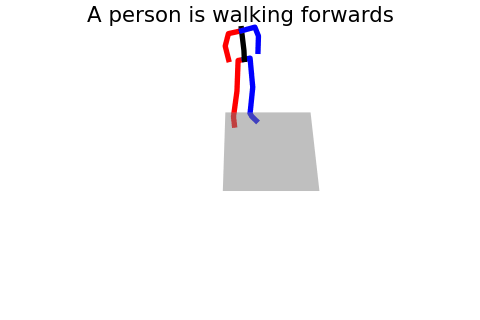

-----------------------------------------------------------------------
-----------------------------------------------------------------------


-----------------------------------------------------------------------
--------------------------- Original Motion ---------------------------



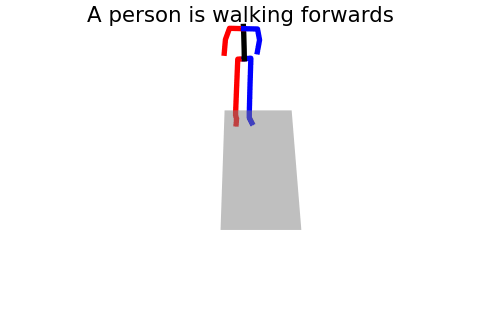

-----------------------------------------------------------------------
-----------------------------------------------------------------------


In [4]:
from IPython.display import HTML
import base64
b64_1 = base64.b64encode(open('decoded_motion.gif','rb').read()).decode('ascii')
b64_2 = base64.b64encode(open('original_motion.gif','rb').read()).decode('ascii')
print('-----------------------------------------------------------------------')
print('--------------------------- Decoded Motion ---------------------------')
display(HTML(f'<img src="data:image/gif;base64,{b64_1}" />'))
print('-----------------------------------------------------------------------')
print('-----------------------------------------------------------------------\n\n')
print('-----------------------------------------------------------------------')
print('--------------------------- Original Motion ---------------------------')
display(HTML(f'<img src="data:image/gif;base64,{b64_2}" />'))
print('-----------------------------------------------------------------------')
print('-----------------------------------------------------------------------')

### -----------------------------------------------------------------------------------------------------------------------------------------------------------
# 3.
## plot 함수 설정 및 모델 초기화

In [15]:
%matplotlib inline
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import torch
import os
os.chdir('/home/semin/git_clone/T2M-GPT')
ckpt_kit = torch.load('output/VQVAE_kit/net_best_fid_pretrain.pth', map_location='cpu')
codebook_kit = ckpt_kit['net']['vqvae.quantizer.codebook']
n_components = 2
model = TSNE(n_components=n_components, random_state=99)
x, y = model.fit_transform(codebook_kit)[:, 0], model.fit_transform(codebook_kit)[:, 1]

def my_plot(file_num: str):
    %matplotlib inline
    print('==================================================================================================')
    file_num = file_num.zfill(5)
    with open(f'dataset/KIT-ML/texts/{file_num}.txt') as file:
        text = file.readline().split('#')[0]

    motion_indices = np.load(f'dataset/KIT-ML/VQVAE/{file_num}.npy')
    motion_indices = motion_indices[0]
    print(f'motion indices: {motion_indices}')
    plt.figure(figsize=(12,15))
    plt.scatter(x[motion_indices[0]], y[motion_indices[0]], color = 'r', label = text)
    for i in range(512):
        if i in motion_indices:
            plt.scatter(x[i], y[i], color = 'r')
        else:
            plt.scatter(x[i], y[i], color='C0')

    order = 1
    x_offset = 0
    overlapped_idx = {}
    for idx in motion_indices:
        if order > 10:
            offset_scaler = 1.9
        else:
            offset_scaler = 1.3
        if idx in overlapped_idx:
            overlapped_idx[idx] += 1
            x_offset = overlapped_idx[idx] * offset_scaler
            plt.text(x[idx]+x_offset, y[idx]+1, s=f", {order}", fontsize=12, fontweight='bold', zorder=100)

        else:
            x_offset = 0
            plt.text(x[idx]+x_offset, y[idx]+1, s=order, fontsize=12, fontweight='bold', zorder=100)
            overlapped_idx[idx] = 0

        order += 1
    plt.title(f'{file_num}.npy',fontsize = 30)
    plt.legend()
    plt.show()
    print('==================================================================================================\n')

### -----------------------------------------------------------------------------------------------------------------------------------------------------------
### my_plot('원하는 번호')를 통해 시각화 가능

motion indices: [ 94  94 240 240 240 240 240 240 440 333  71 392 242 133  86 506 185 185
 185]


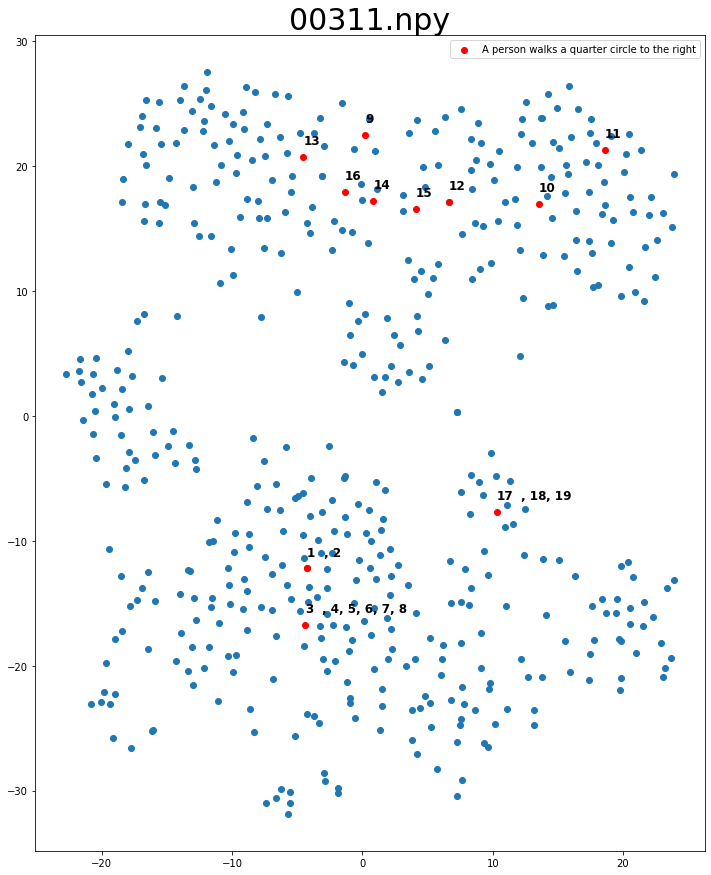

In [6]:
my_plot('311')

motion indices: [115 340  95 164  26  26 233  86 186 365 236 444 215  87 490 100 314 219
 120 264 109 493 226]


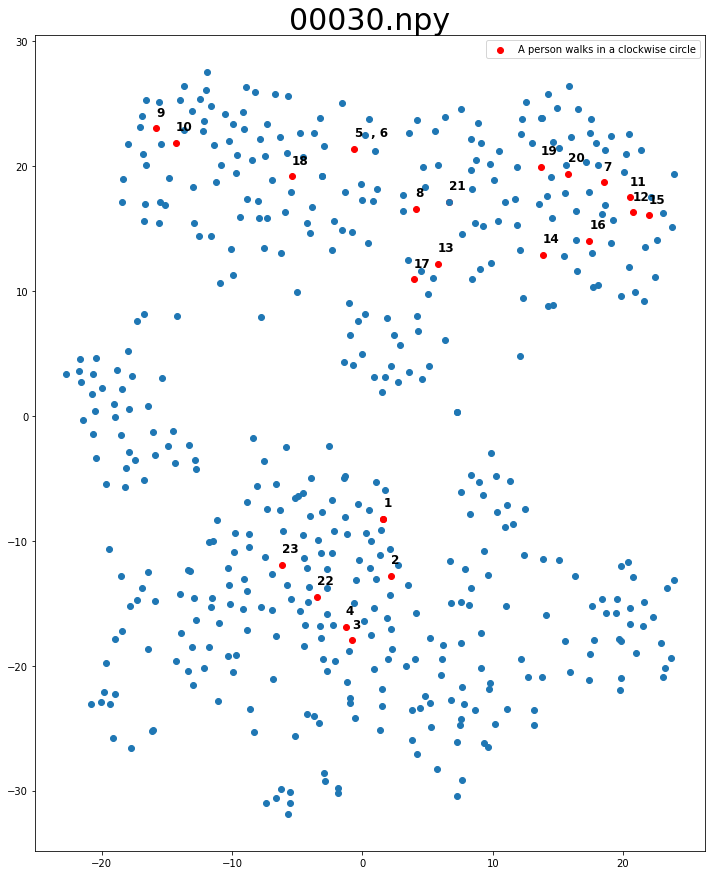


motion indices: [482 226  80 365 365 295 312 427 202 236 236  87 445 100 490 188 440 466
  71 333 306 210  79]


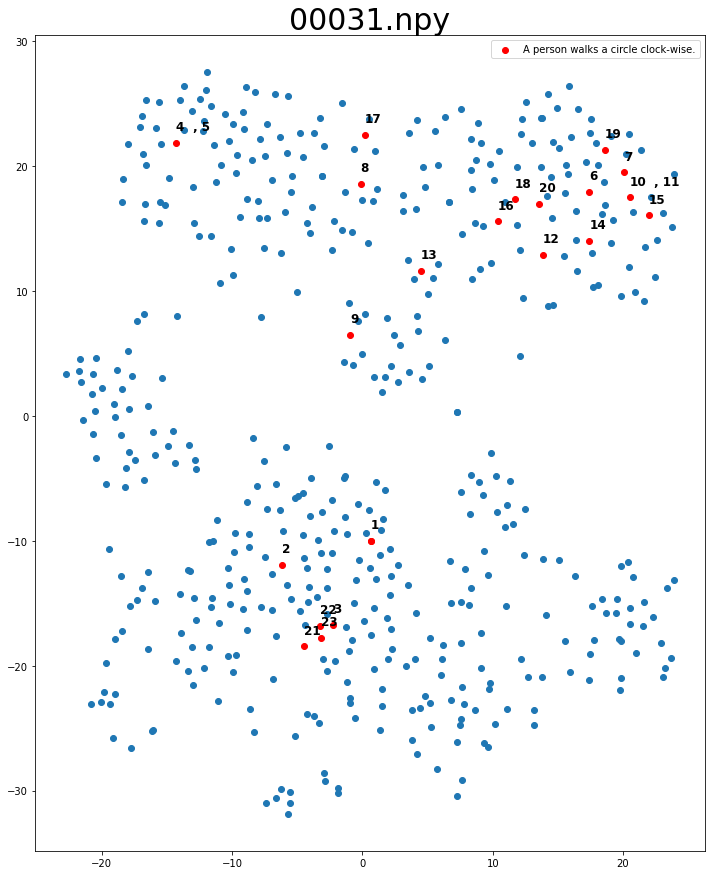


motion indices: [208 303 303 340 408 427 233 312  86 427 236 345 444 445 445  43 120 488
 313 188 217 191  83 493]


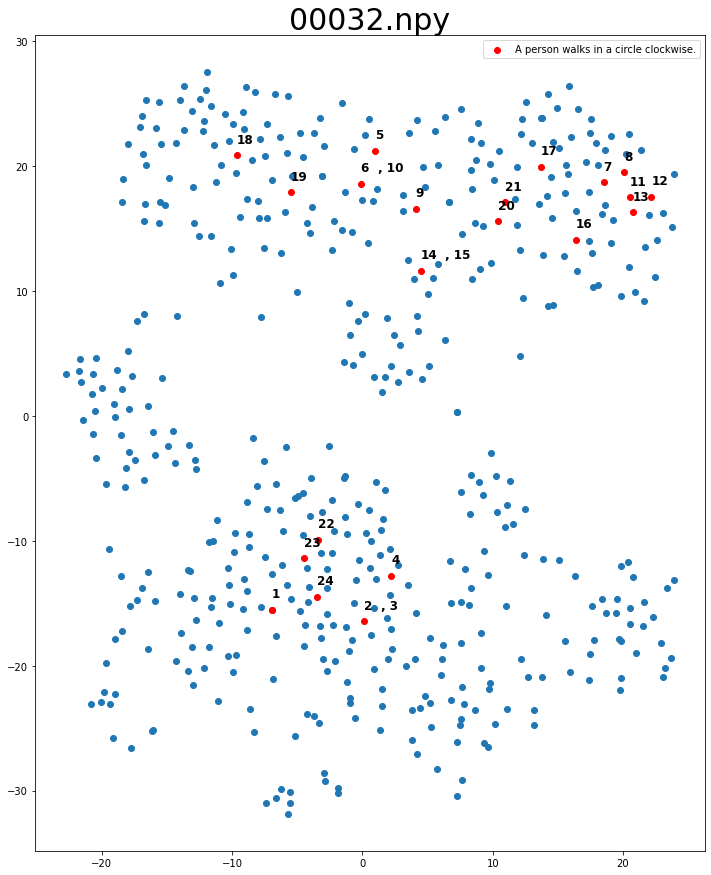


motion indices: [145  95  95 340  81  26  70 233  86 365 506 236 444  87  87 100 100 314
 177 188 386 217  95  95  95]


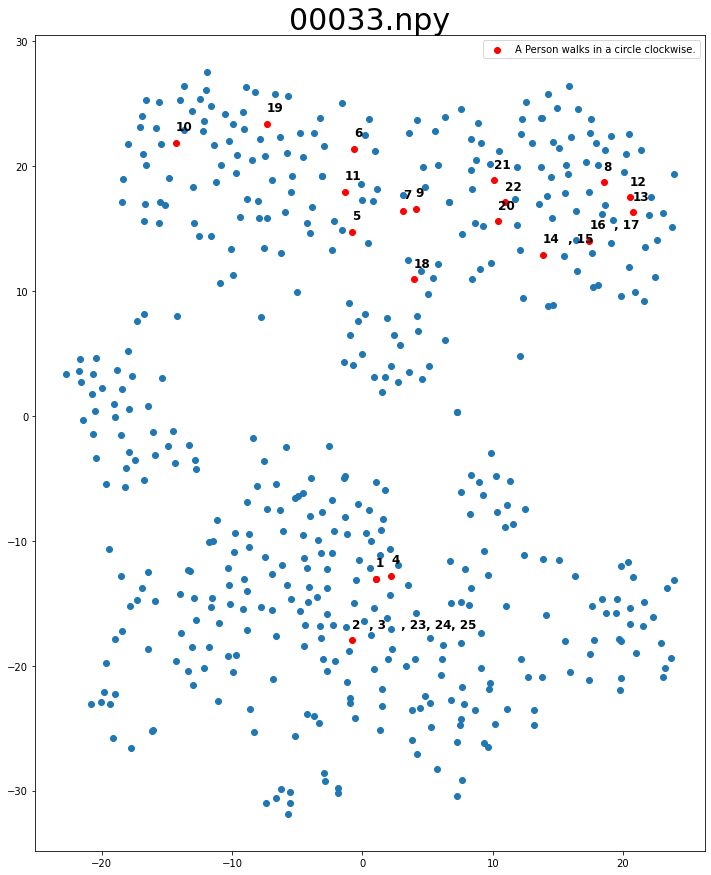


motion indices: [241 340 509 368 368 130 233 365  28 345 345 444 445  43 100  87 446 314
 470 406 482 145 340 340 385]


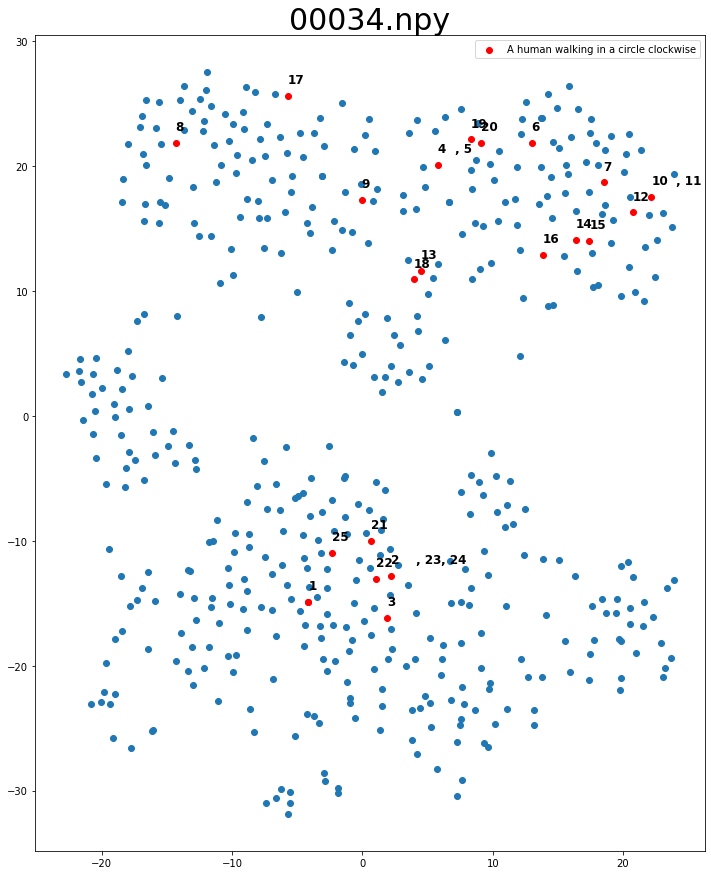


motion indices: [ 16 340  95 303 340 109  26 295 312  86 427  73 345 444 445  87 490 100
 219 313 120 264 493 241 493]


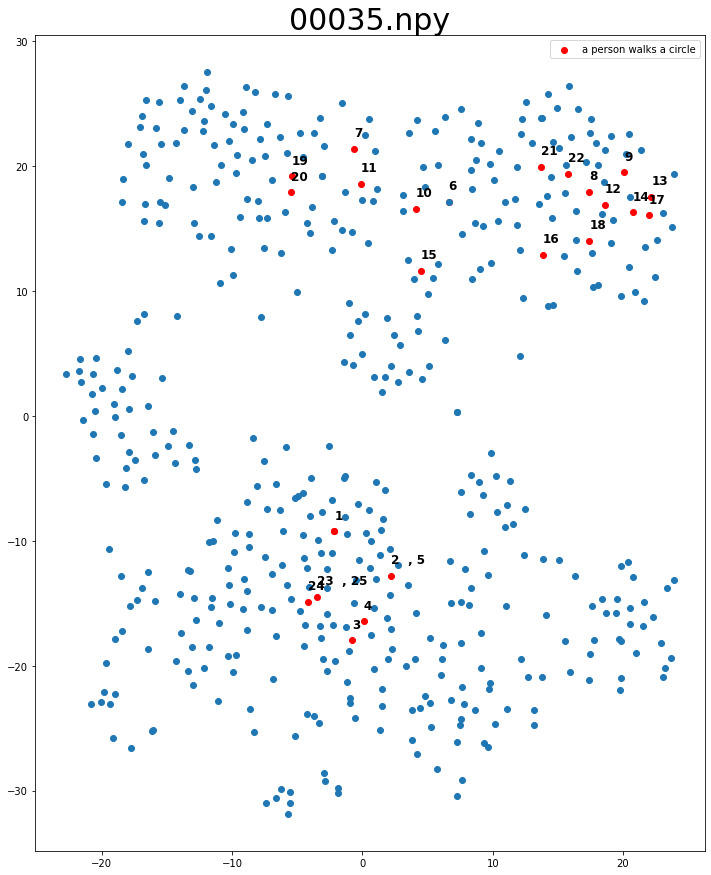


motion indices: [290 115 340  81  26 295 312 295   6 236 345 345 420  87 100  87  37 314
 406  53  25 429]


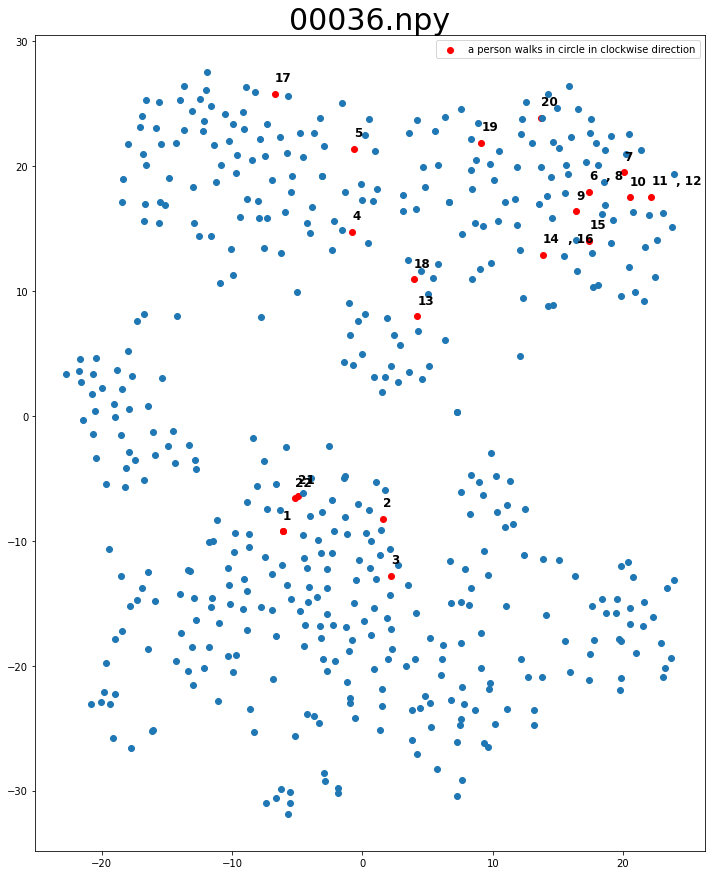


motion indices: [370 502  31 367 445 440 264  88 264 427 233 312  73 426 151 236  43  37
  87 490  87 367 367 367]


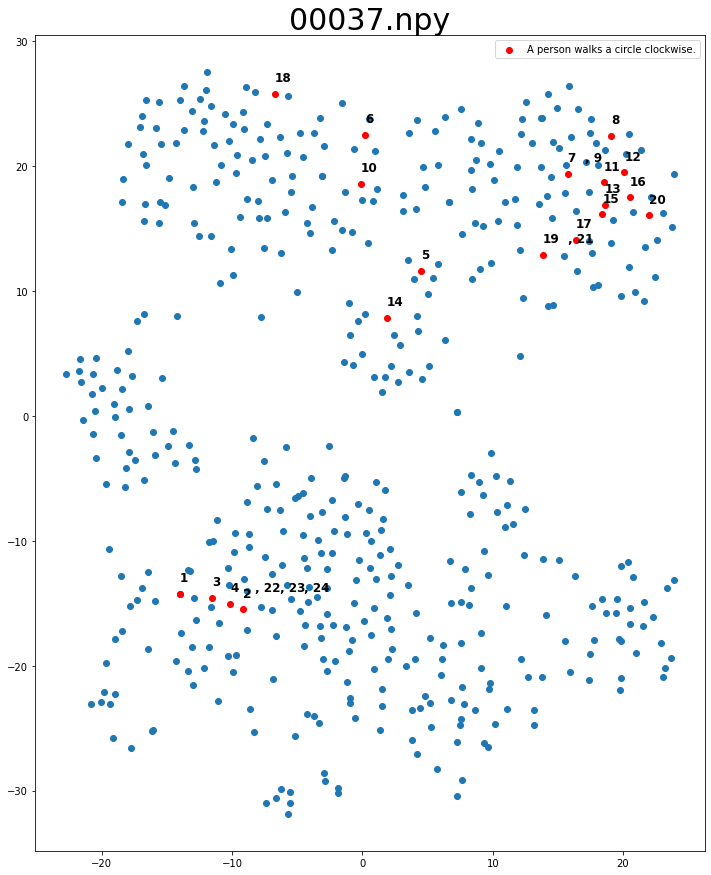

In [7]:
for i in range(30, 38):
    my_plot(str(i))

motion indices: [482 482 482 482 482 482 174 218 117 121 428]


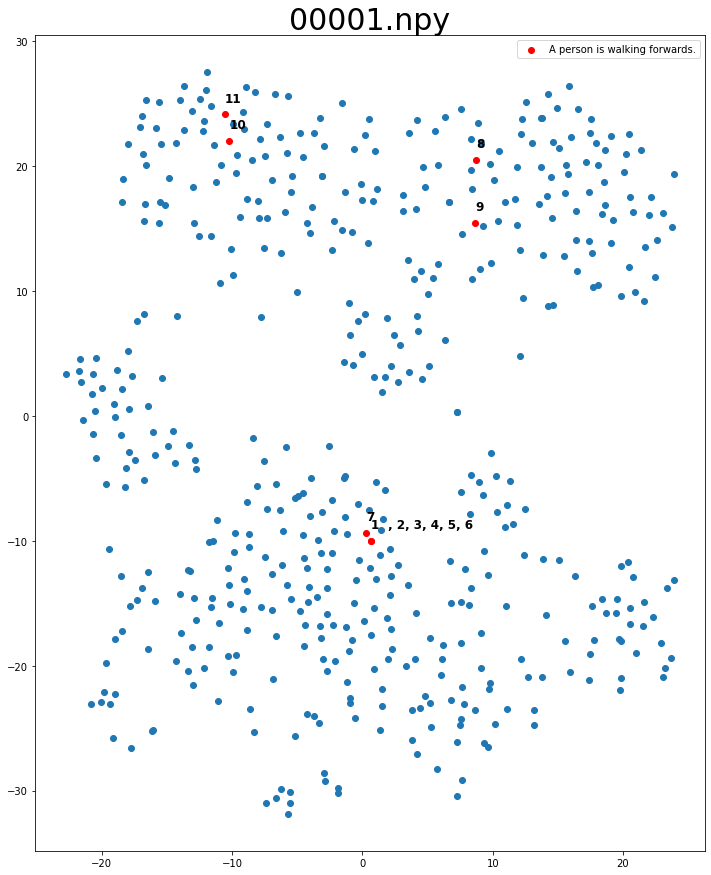


motion indices: [432 482 502 108 429 174 308 218  42  20  25 130 308 261  21 164]


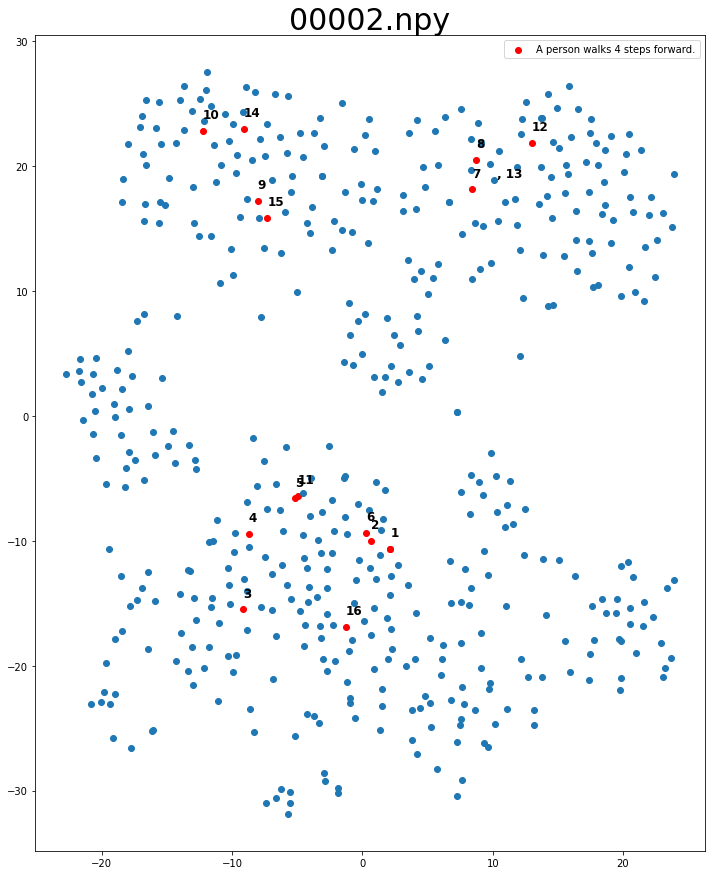


motion indices: [502 482 482 429 174  82 308 121 488  36 218 499 261 482 191 191 191]


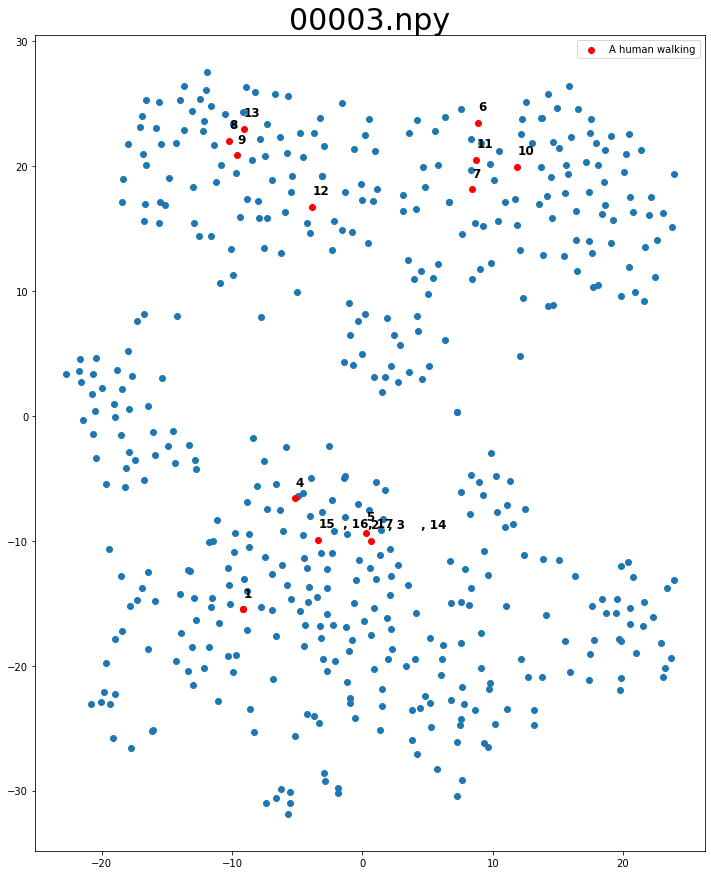


motion indices: [340  10  10  10  16 340  71  10 219  21  36 406  21 261 367 502 468]


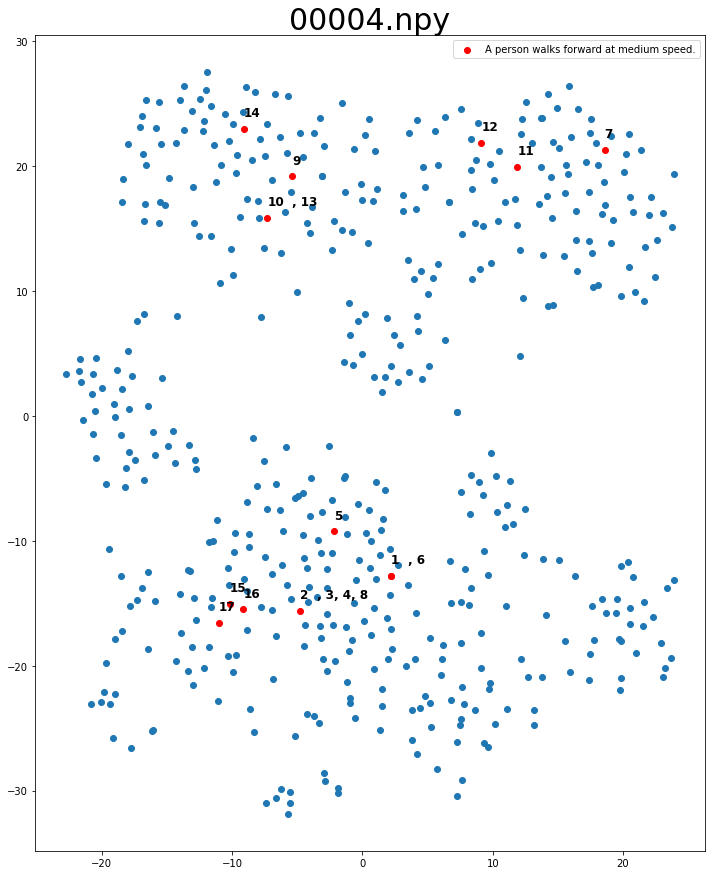


motion indices: [482 482 482 482 145 145 130  42 121 378 114 308 488 488 432  16  16  16]


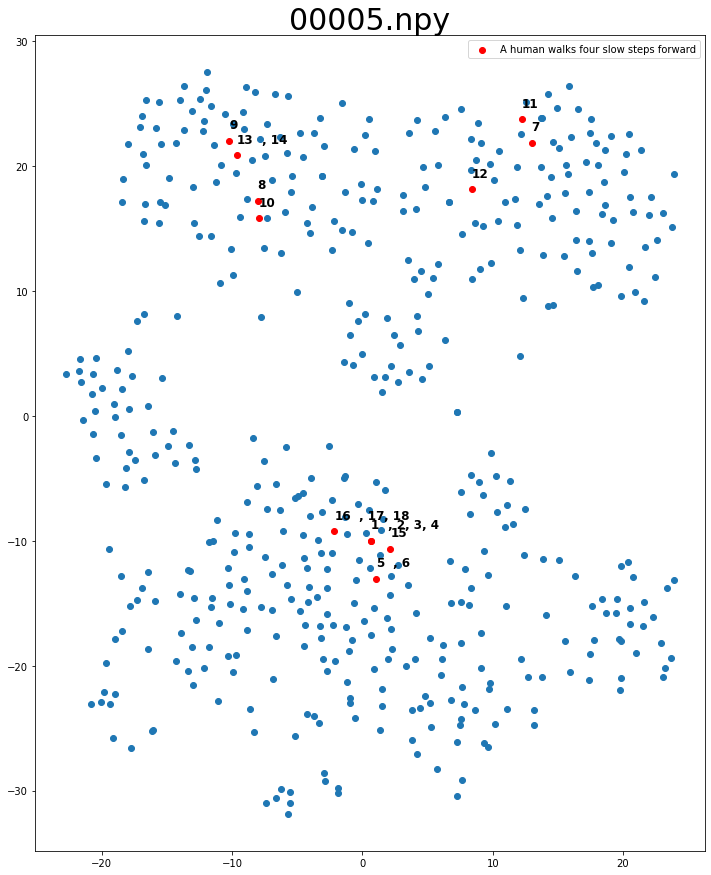


motion indices: [252 502 210 340 210 174 498 114 392 488 261 117 114  19 261 502 482  16
 429]


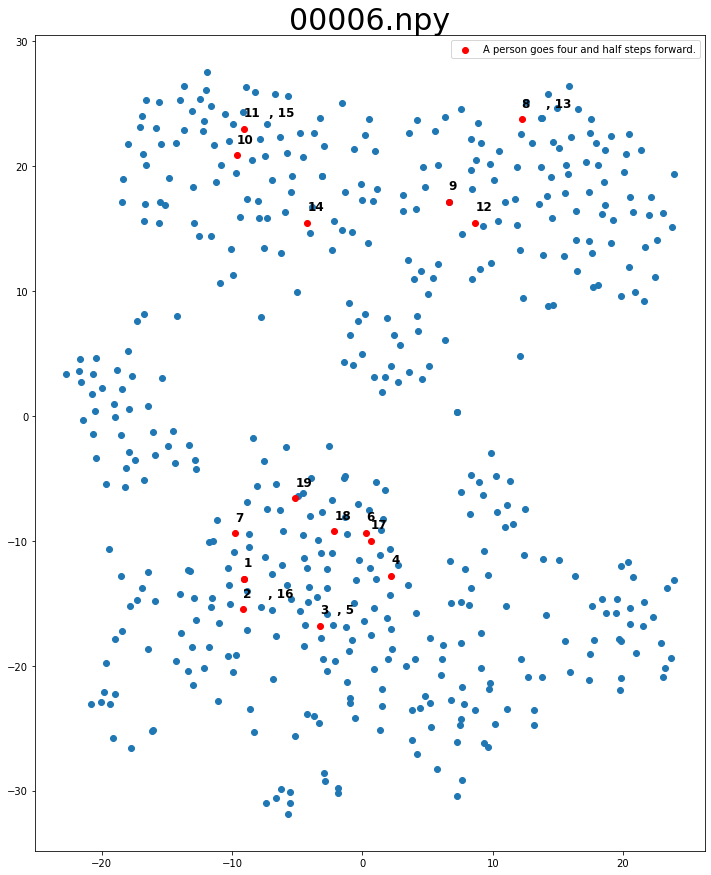


motion indices: [144 196 144 191  25  83  53  38 121 488 111  53 378 261 252 252 145 145]


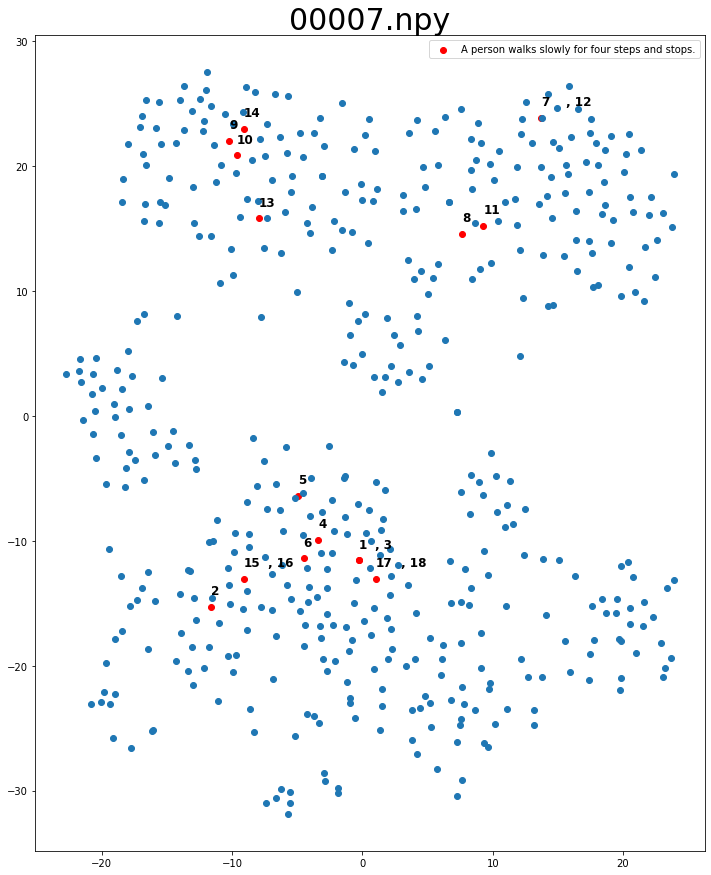


motion indices: [429 502 145 340  95 145 466 466 326 121 338 114  21 488 252 502 482  16
 482]


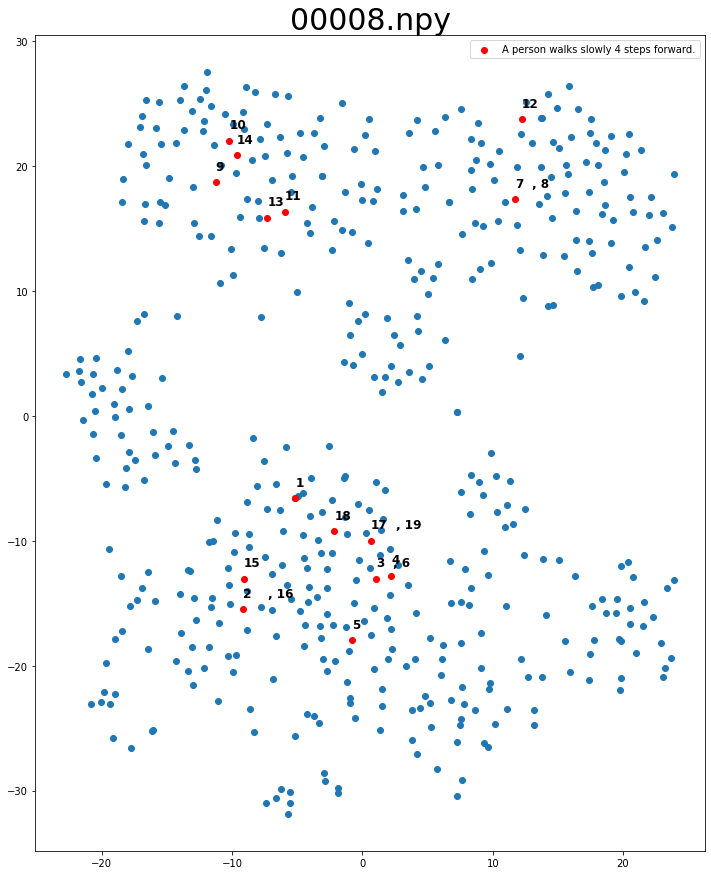


motion indices: [252 145 502 145 429 308 130 378 330  21 218 308 488 488 164 191 226 191
 191]


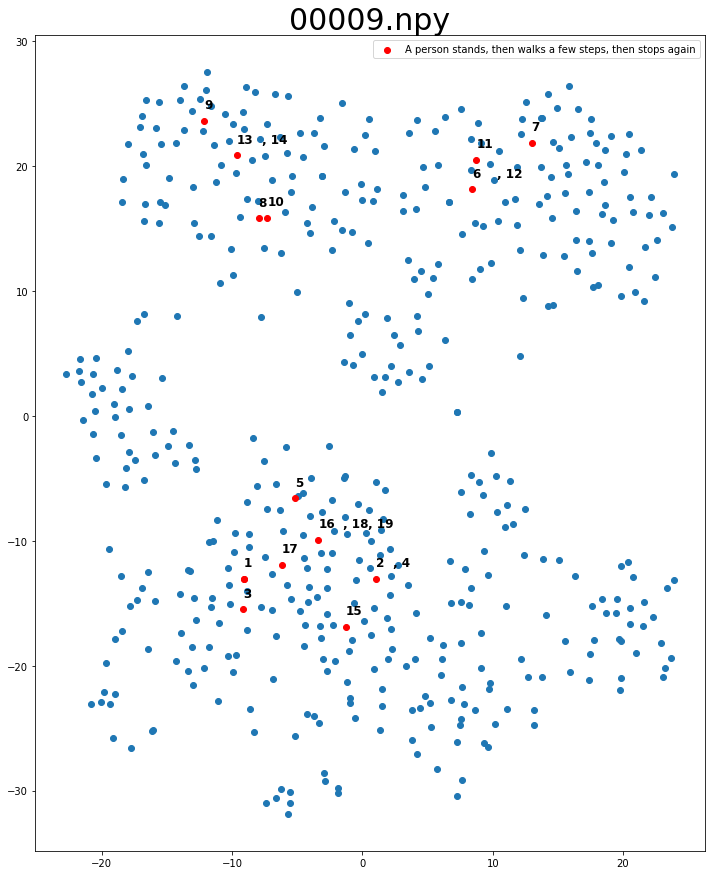

In [8]:
for i in range(1,10):
    my_plot(str(i))

### -----------------------------------------------------------------------------------------------------------------------------------------------------------
# 4.
## 비슷한 annotation인 30~37까지를 t-sne로 확인


30: A person walks in a clockwise circle
31: A person walks a circle clock-wise.
32: A person walks in a circle clockwise.
33: A Person walks in a circle clockwise.
34: A human walking in a circle clockwise
35: a person walks a circle
36: a person walks in circle in clockwise direction
37: A person walks a circle clockwise.


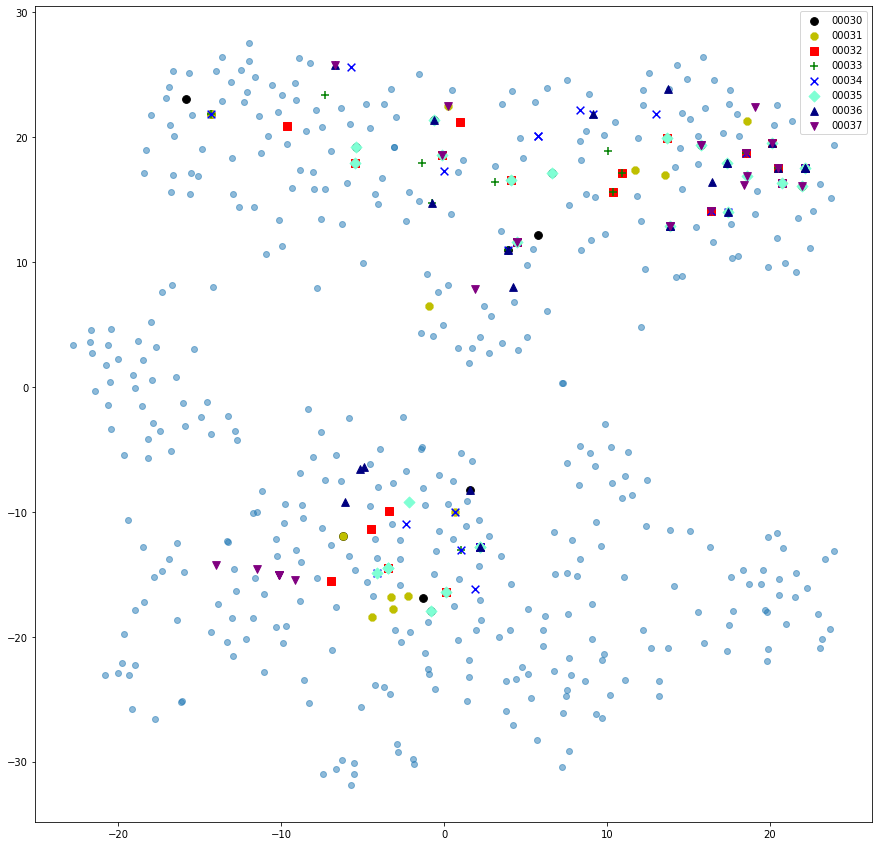

In [9]:
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import torch
import os
os.chdir('/home/semin/git_clone/T2M-GPT')
ckpt_kit = torch.load('output/VQVAE_kit/net_best_fid_pretrain.pth', map_location='cpu')
codebook_kit = ckpt_kit['net']['vqvae.quantizer.codebook']
n_components = 2
model = TSNE(n_components=n_components, random_state=99)
x, y = model.fit_transform(codebook_kit)[:, 0], model.fit_transform(codebook_kit)[:, 1]




color_list = ['black', 'y', 'r', 'g', 'blue', 'aquamarine', 'navy', 'purple', 'chocolate']
marker_list = ["o", "8", "s", "+", "x", "D", "^", "v"]

plt.figure(figsize=(15,15))
full_motion_indices = set()

for i in range(30,38):
    file_name = f'{i}'.zfill(5) +'.txt'
    text_path = os.path.join('dataset/KIT-ML/texts',file_name)
    with open(text_path) as file:
        print(f'{i}: {file.readline().split("#")[0]}')
    
    file_num = str(i).zfill(5)
    motion_indices = np.load(f'dataset/KIT-ML/VQVAE/{file_num}.npy')
    motion_indices = motion_indices[0]
    full_motion_indices.update(set(motion_indices))
    plot_label = True
    for idx in motion_indices:
        if plot_label:
            plt.scatter(x[idx], y[idx], color=color_list[i-30], marker=marker_list[i-30], label=file_num, s=60,zorder=100)
            plot_label = False
        else:
            plt.scatter(x[idx], y[idx], color=color_list[i-30], marker=marker_list[i-30], s=60,zorder=100)
            
for i in range(512):
    if i not in full_motion_indices:
        plt.scatter(x[i], y[i], color='C0', alpha=0.5)

plt.legend()
plt.show()

### -----------------------------------------------------------------------------------------------------------------------------------------------------------
# 5.
## motion을 스켈레톤으로 확인하는 함수 정의 및 초기화


In [10]:
import os
os.chdir('/home/semin/git_clone/T2M-GPT/') # path를 자신의 환경에 맞게끔 수정

import options.option_transformer as option_trans
import sys
import clip
import torch
import numpy as np
import models.vqvae as vqvae
import models.t2m_trans as trans
import warnings
warnings.filterwarnings('ignore')


sys.argv = ['test']

args = option_trans.get_args_parser()

args.dataname = 'kit'
args.resume_pth = 'pretrained/KIT/VQVAE_KIT/net_best_fid.pth'
args.resume_trans = 'pretrained/KIT/VQTransformer_KIT_fid_16head_1024dim_18layer_05/net_best_fid.pth'
args.down_t = 2
args.depth = 3
args.block_size = 51

net = vqvae.HumanVQVAE(args, ## use args to define different parameters in different quantizers
                       args.nb_code,
                       args.code_dim,
                       args.output_emb_width,
                       args.down_t,
                       args.stride_t,
                       args.width,
                       args.depth,
                       args.dilation_growth_rate)
print ('loading checkpoint from {}'.format(args.resume_pth))
ckpt = torch.load(args.resume_pth, map_location='cpu')
net.load_state_dict(ckpt['net'], strict=True)
net.eval()
net.cuda()

mean = torch.from_numpy(np.load('./checkpoints/kit/VQVAEV3_CB1024_CMT_H1024_NRES3/meta/mean.npy')).cuda()
std = torch.from_numpy(np.load('./checkpoints/kit/VQVAEV3_CB1024_CMT_H1024_NRES3/meta/std.npy')).cuda()

import visualization.plot_3d_global as plot_3d
from IPython.display import HTML
import base64

def view_skeleton(file_num: str):
    file_num = file_num.zfill(5)
    
    with open(f'dataset/KIT-ML/texts/{file_num}.txt') as f:
        text = f.readline()
    text = (text.split("#")[0]).split(".")[0]
    text = [f'{text}: {file_num}']
    org_xyz = np.load(f'dataset/KIT-ML/new_joints/{file_num}.npy')
    org_xyz = org_xyz.reshape(1, -1, org_xyz.shape[1], org_xyz.shape[2])
    pose_vis = plot_3d.draw_to_batch(org_xyz, text, [f'motion: {file_num}.gif'])
    b64 = base64.b64encode(open(f'motion: {file_num}.gif','rb').read()).decode('ascii')
    print('==================================================================================================')
    display(HTML(f'<img src="data:image/gif;base64,{b64}" />'))
    print('==================================================================================================\n')

code_dim: 512
loading checkpoint from pretrained/KIT/VQVAE_KIT/net_best_fid.pth


### -----------------------------------------------------------------------------------------------------------------------------------------------------------

### plot + skeleton 확인


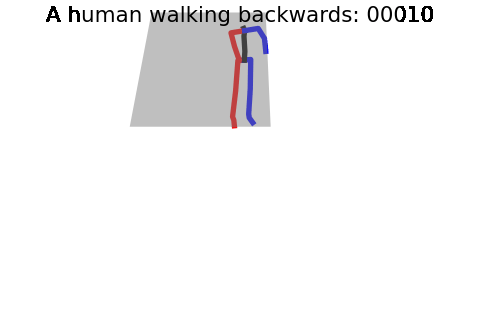

In [18]:
view_skeleton(str(10))

motion indices: [115 340  95 164  26  26 233  86 186 365 236 444 215  87 490 100 314 219
 120 264 109 493 226]


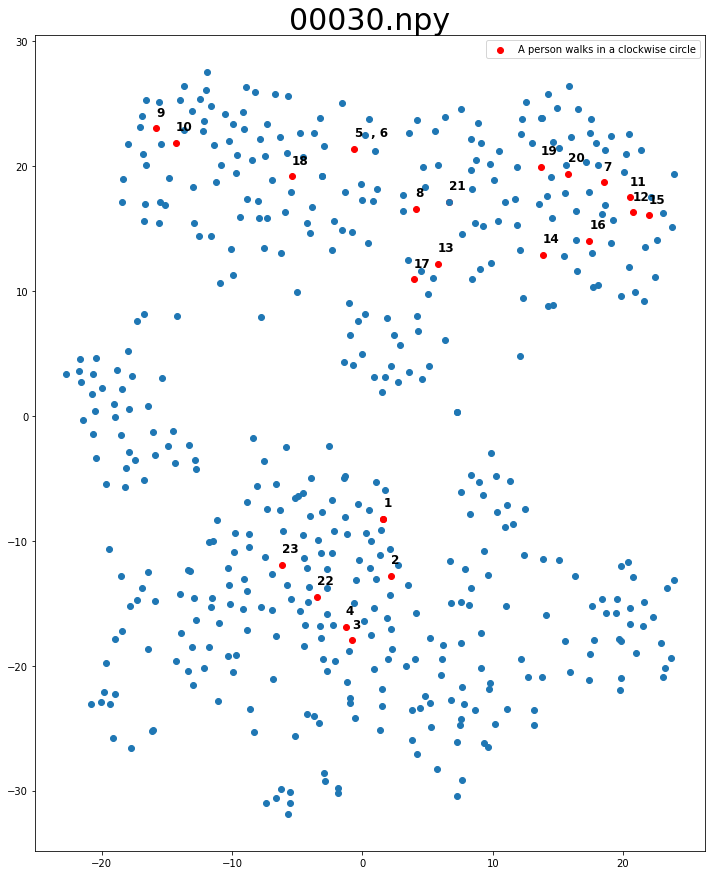


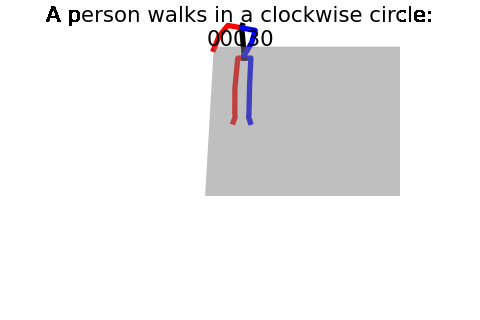


motion indices: [482 226  80 365 365 295 312 427 202 236 236  87 445 100 490 188 440 466
  71 333 306 210  79]


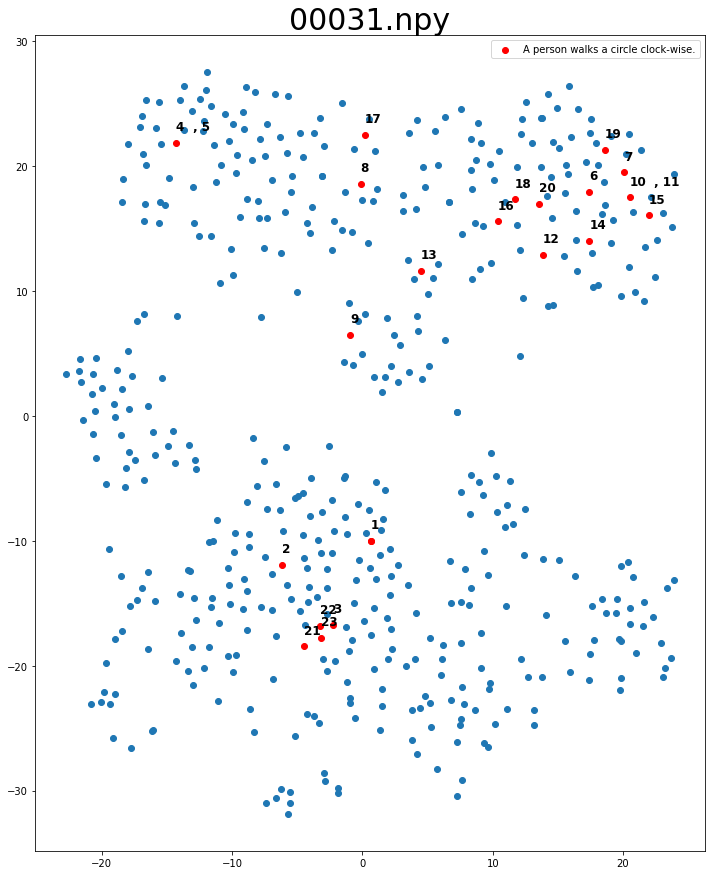


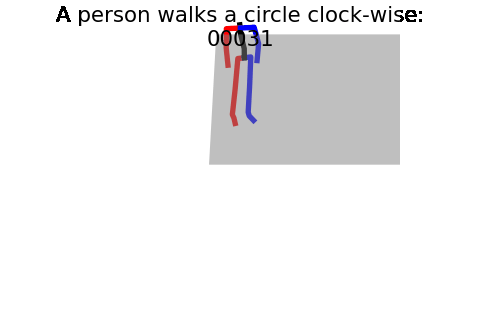


motion indices: [208 303 303 340 408 427 233 312  86 427 236 345 444 445 445  43 120 488
 313 188 217 191  83 493]


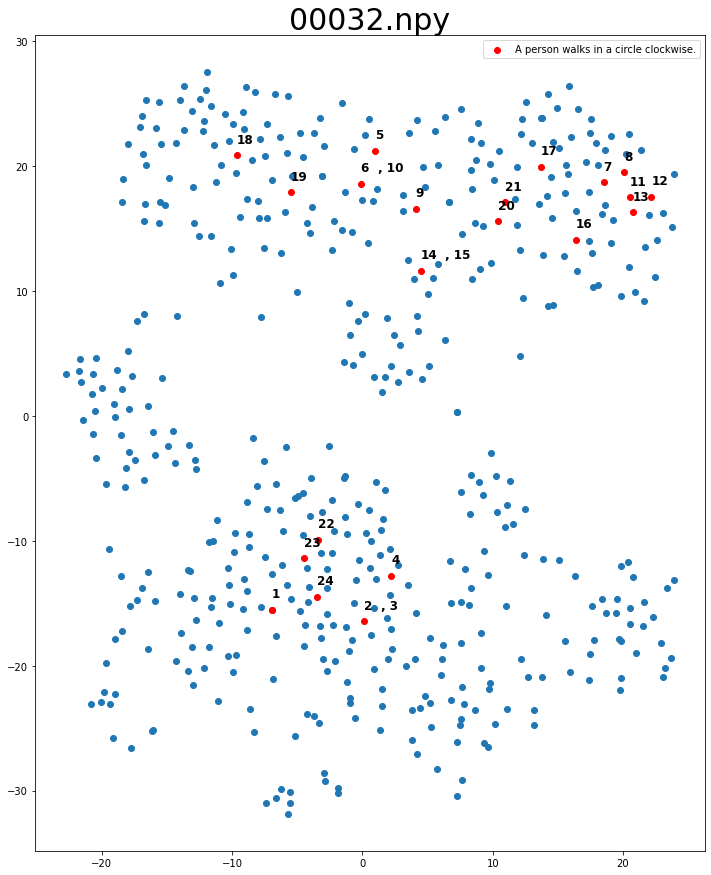


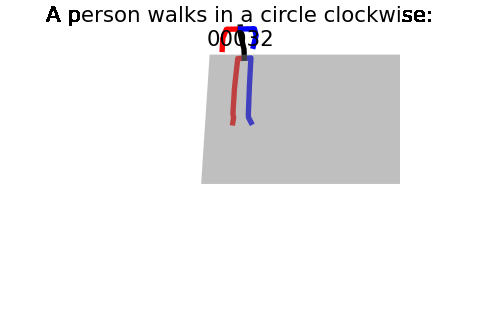


motion indices: [145  95  95 340  81  26  70 233  86 365 506 236 444  87  87 100 100 314
 177 188 386 217  95  95  95]


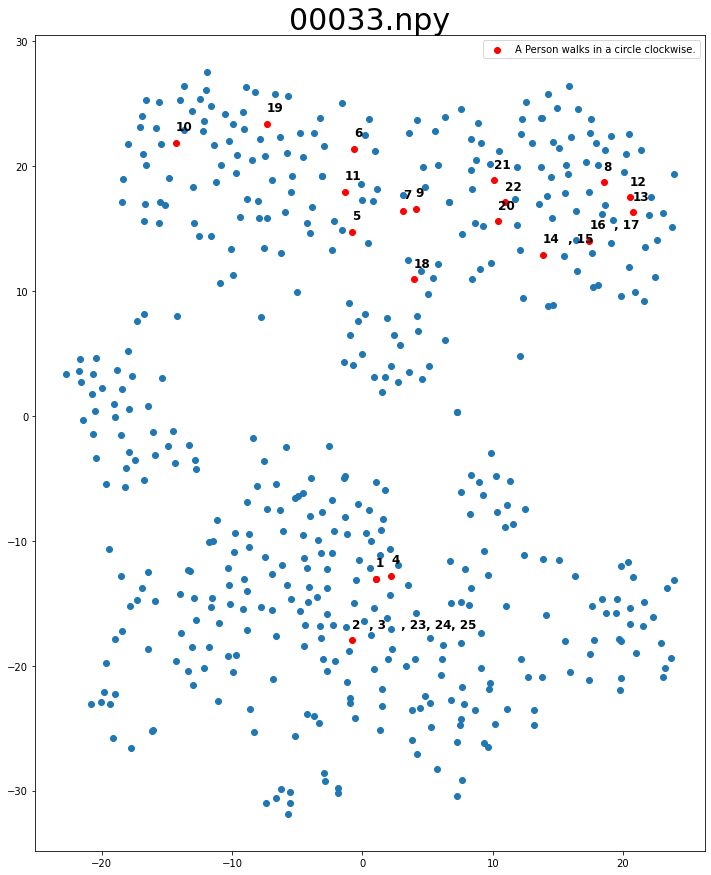


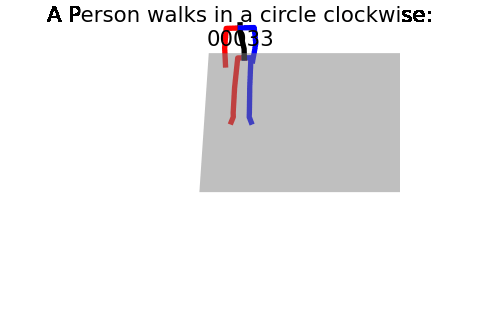


motion indices: [241 340 509 368 368 130 233 365  28 345 345 444 445  43 100  87 446 314
 470 406 482 145 340 340 385]


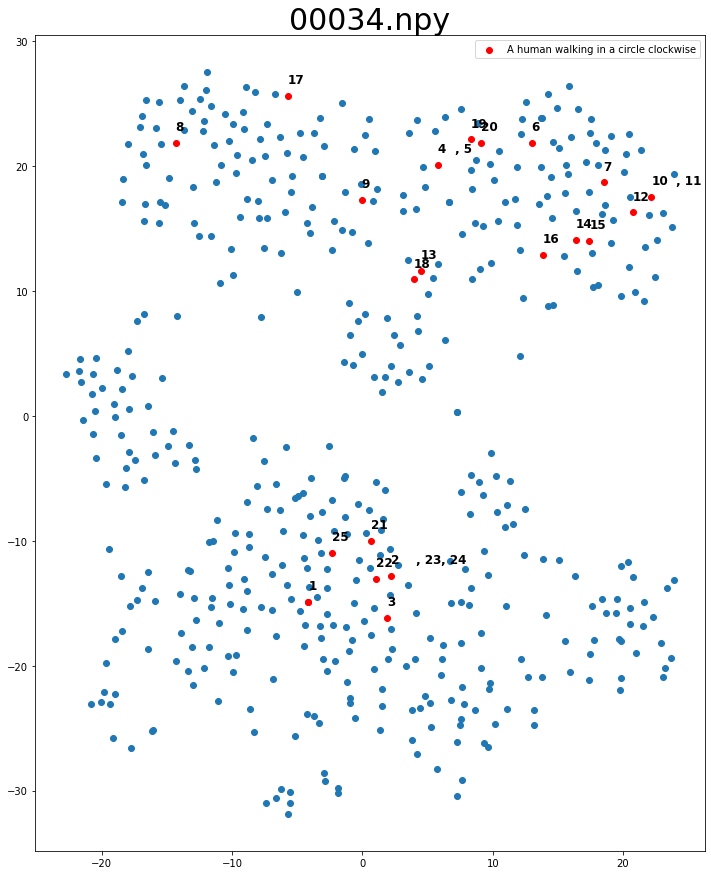


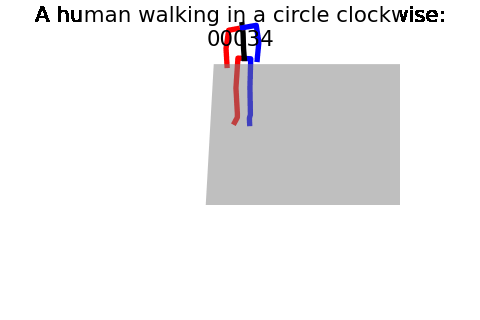


motion indices: [ 16 340  95 303 340 109  26 295 312  86 427  73 345 444 445  87 490 100
 219 313 120 264 493 241 493]


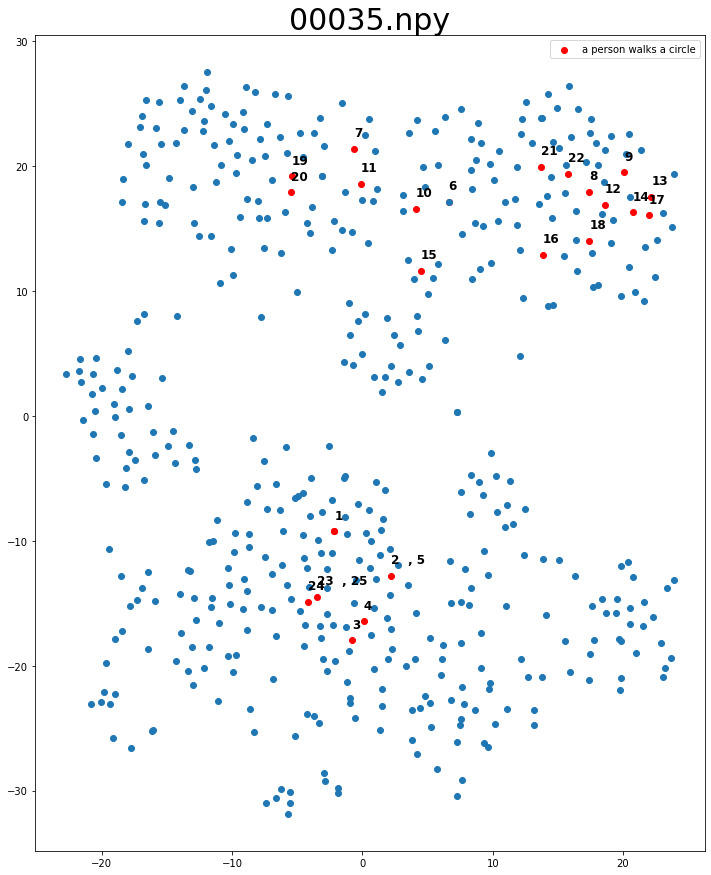


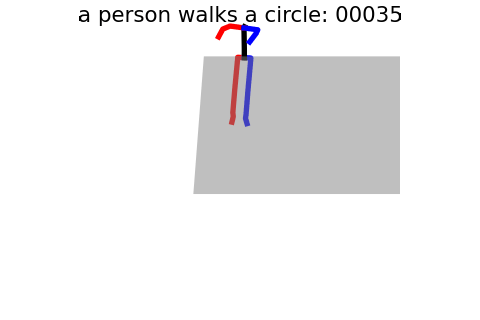


motion indices: [290 115 340  81  26 295 312 295   6 236 345 345 420  87 100  87  37 314
 406  53  25 429]


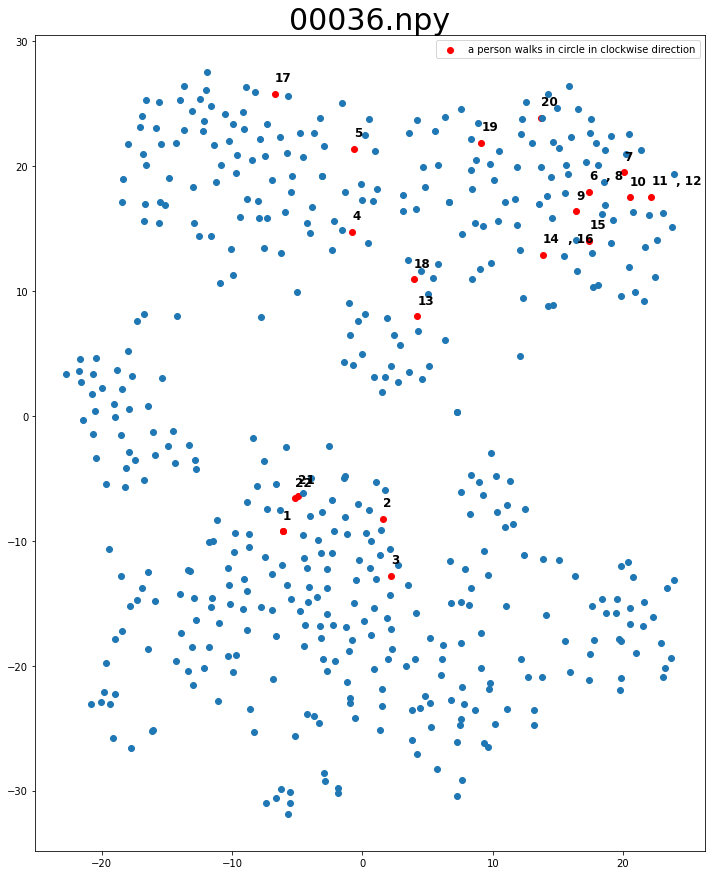


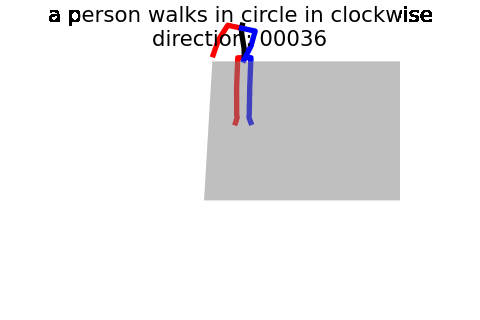


motion indices: [370 502  31 367 445 440 264  88 264 427 233 312  73 426 151 236  43  37
  87 490  87 367 367 367]


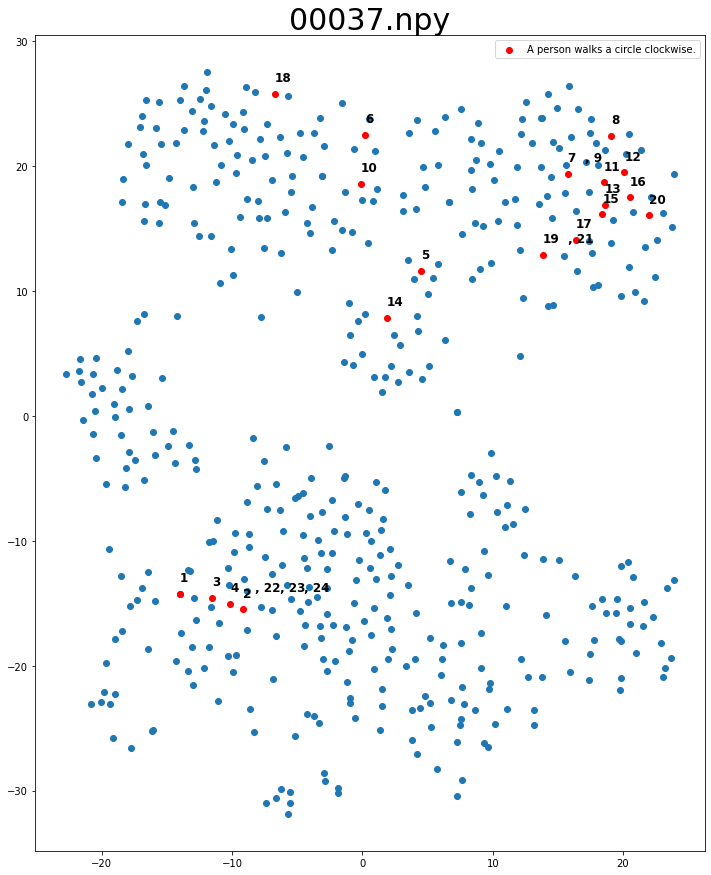


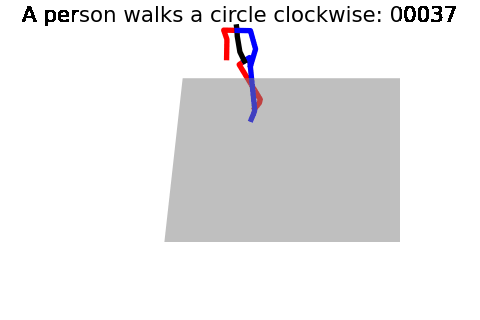

In [16]:
for i in range(30, 38):
    my_plot(str(i))
    view_skeleton(str(i))